# Workshop 1: Open Source AI is Awesome! 🚀

- **When:** Wednesday, 5th February, 17:00.
- **Where:** Appleton Tower, 5.04. If you don't have access, reach out and we'll let you in!
- **Contacts:** Reach out on Instagram _@edinburgh.ai_
- **Credits:** This notebook is created by EdinburghAI for use in its workshops. If you plan to use it, please credit us!

## Today
- Building an actually good Spotify DJ! 🎸
- There'll be two hosts talking to eachother out loud! 🎤
- What'll they talk about? Whatever the user wants! They'll use my University notes as a source of information! 📚 
  - Ok I know that sounds lame, but the idea is to take boring uni materials and make them into an interesting radio show! 

Lfg 🔥

# Setup:

## IMPORTANT! Turn On Internet
1. On the right-hand side of this notebook, there's a section called **"Session Options"**.
2. Scroll down to the _"Internet"_ toggle. Turn it on. You may need to verify your phone number.
3. Additionally, to help this run faster, you can also enable some GPU access.


## Using Jupyter:
This is a Jupyter notebook. It contains cells. There are 2 kinds of cells - markdown and Python. Markdown cells are like this one, and are just there to give you information. Python cells run code. You can run a cell with `Ctrl + Enter` or run a cell and move the next one with `Shift + Enter`. Try running the cell below.


In [1]:
print('Ctrl + Enter runs this cell!')
output = 'The last line of a cell is printed by default'
output

Ctrl + Enter runs this cell!


'The last line of a cell is printed by default'

#### What YOU Need To Do
    
- There are places to write code, indicated by `...` and a comment with `TODO:` in a python cell. You should fill these in or nothing will work! If you have any questions, just ask one of the EdinburghAI people :)

- There are points to stop and think indicated by **Think🤔**. Please stop, think, maybe write an answer, and discuss with those around you.

- There are also questions labelled **Extension😈**. These are more optional, and are for those of you who might have done some similar stuff before. Feel free to have a think about these questions though!

Good luck!

## So What're We Building? 🛠️

Here's the vision: 

- Gone are the days we have to read boring university notes! With our brand new radio show, you'll be able to learn your uni material in an actually fun way!  
- The radio show will have 2 hosts. 
- The user will ask a (uni-related) question.
- The hosts will use my uni notes (hosted on [www.leocamacho.co](www.leocamacho.co)) to answer the question. (Shameless self-promo i.k. lol)
- The hosts will talk to eachother out loud! 🎤


## The Tech Stack 🤔

- We'll use an _open_ LLM to generate the conversation in full.
- We'll use a _open_ TTS model to generate the audio of each speaker.
- We'll use an _open_ embedding model to store all of our notes as vectors. Then when the user asks a question, we'll use the embedding model to find the most similar notes and use them to answer the question. 


# Using RAG to answer questions! 🔍

We want our model to take our Uni notes and use them to generate a conversation. But it would be incredibly innefficient to pass every single note into the model. Instead, we'll use a technique called _RAG_ (Retrieval Augmented Generation). 

Remember that we can encode language into vector space. If you don't remember, take a quick refresher [here](https://github.com/EdinburghAI/workshops/blob/main/Sem1Workshop4/LanguageModels-Solved.ipynb) or [here](https://leocamacho.co/Vector-Embeddings).  *TLDR:* We can represent language in some super-high dimension vector space. (We can think of) Each direction in this space to have meaning. Therefore (with some mental gymnastics and serious hand-waving), the vector for _"Paris"_ will be really close to the vector for _"The French city with the Eiffel Tower"_. (And who knows, maybe Las Vegas is close to that as well). 

RAG is a technique where we first _embed_ our notes. Then, we embed the query the user asks. Then, we find the most similar note to the query the user asked (using similarity search). We'll then pass these notes into the model to answer the question. (I.e. Retrieve a note and pass it into the prompt of the model).

How do we do this?

### Creating The Vector Database 🔍

We're going to use the Uni notes from my website ([www.leocamacho.co](www.leocamacho.co)) as the source of truth for our RAG system. I recommend checking it out and going searching for some notes. I've got pretty extensive notes for Computer Systems, Intro to Algorithms and Data Structures, and Computer Security. 

##### Note:
Since none of the notes are too long, we can load the entire note as a single vector. If we instead had a single very long pdf, or multiple long notes, we'd have to split them into chunks. We'd have use something like [LangChain's Sentence Splitter](https://python.langchain.com/api_reference/text_splitters/sentence_transformers/langchain_text_splitters.sentence_transformers.SentenceTransformersTokenTextSplitter.html) to do this. 

To access the notes on the Kaggle Notebook, do the following. Alternatively, if you're running this notebook somewhere else, you can [download the dataset here](https://www.kaggle.com/datasets/leocamacho1/edinburghai-sem2-workshop1-univesitynotes/data).

- Click Add Input -> Datasets
- Search 'EdinburghAI-Sem2-Workshop1-UniversityNotes'
- Click the '+' icon

Alternatively, if Kaggle is being annoying and that's not working, try the following:
1. Go to the top-left, Run > Factory Reset. If that doesn't work, try the below
2. Open the *"Download the dataset here".*
3. *"Download"* at the top right
4. *"Download as a zip"*.
5. Then come back to this notebook, go to the right hand side, press *"Upload"*.
6. Import the file you just downloaded. You're going to have the change the _"/kaggle/input/edinburghai-sem2-workshop1-univesitynotes/notes_dataset.csv"_ to the name you gave it. 

In [2]:
import pandas as pd 

df = pd.read_csv("/kaggle/input/edinburghai-sem2-workshop1-univesitynotes/notes_dataset.csv")
df.head()

# Take just the Content column and make it into a list. 
# We'll use this list as the embeddings of our notes.
notes = df["Content"].tolist()

### Embedding The Notes 🔍

We'll use [Sentence Transformer](https://www.sbert.net/) to vectorise the notes, and [FAISS](https://github.com/facebookresearch/faiss/blob/main/tutorial/python/1-Flat.py) to store them (and perform similarity searches). 

First, let's find which embedding model we'll use. HuggingFace has a [list of embedding models](https://huggingface.co/models?library=sentence-transformers&amp;author=sentence-transformers). HuggingFace is like the GitHub of open source AI models, datasets and more. 



In [3]:
from sentence_transformers import SentenceTransformer

# Load the model and encode the notes. Loading and encoding typically takes ~2 minutes the first time you run it.
# You can make it faster by adding a GPU to this notebook. I highly recommend doing this. 
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
embeddings = model.encode(notes)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/15 [00:00<?, ?it/s]

In [4]:
!pip install faiss-cpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.7/30.7 MB 58.1 MB/s eta 0:00:00:00:0100:01


In [5]:
# We'll use FAISS to store the embeddings. 
import faiss


# TODO: First, find out how many dimensions there are in the embeddings. 
# You can either check the model's description, or print the *shape* of the embeddings 😉. 
# Hint: Click through some of the links. They might be helpful. 
dimension = embeddings.shape[1]
print(f"Embedding dimensions: {dimension}")

Embedding dimensions: 384


In [6]:
# TODO: We'll need to store the embeddings somewhere. 
# You can think of the "Index" of FAISS as a database, one optimised for similarity searches.
# I recommend using Flat L2 Index. It's fast and works well for our use case. 
index = faiss.IndexFlatL2(dimension)

# Now, we'll add the embeddings to the index.
index.add(embeddings)

# Print how many vectors are in the index.
print(f"Total vectors {index.ntotal}")


Total vectors 475


In [7]:
# Now, we'll use the index to find the most similar vectors to a query.
query = "How does attention work?"

# TODO: We want to encode(!) our query into a vector. Remember, that normally, the "encoding" function expects a list of queries...
query_embedding = model.encode([query])

# We'll use the index to find the most similar vectors to the query. I recommend setting k to 1 (But feel free to experiment!).
k = 1 # Num nearest neighbours
# TODO: Search and return the distances and indices of the nearest neighbours.
distances, indices = index.search(query_embedding, k)

# TODO: Use some python magic to get the corresponding relevant notes (in English), using the indices we found from above.
# Hint: The indices are the indices (of the relevant notes) correspond to the notes in the original list.
relevant_notes = [notes[i] for i in indices[0]]

# Now, we'll print the most similar vectors to the query.
print(f"Nearest Neighbours: {relevant_notes}")

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Nearest Neighbours: ['Attention (AI).md\n\n## Goal Of Attention:\nWords have different meaning depending on the context (i.e. *"Make a bank deposit"* vs. *"The river bank"*). But with traditional [[Vector Embeddings]] (and after the first step of an [[Large Language Models (LLMs)|LLM]]), the *"bank"* embedding will be identical. \n\nIdeally, an *"Attention Block"* will change (i.e. add/subtract to) those individual word vectors, so they (the vectors signifying the meaning of a word) move to a more accurate position (i.e. a position more reflective of its actual meaning). \n\n##### Example: \nTake the *"monster"* vector. It\'s not very descriptive of anything in particular (other than an abstract, scary large and looming figure). Now take the sentence: *"The green, 1-eyed creature is the star of the Disney Pixar movie. He\'s short, has small horns and a non-confrontational figure. He\'s not a very menacing **monster**."*. Ideally, the second instance of *"monster"* is incredibly close t

# Now Let's Generate The Conversation! 🎤

We're going to use Meta's Llama 3.2 model. It's got 1 billion parameters. While that sounds like a lot, it's actually small enough to run on your _phone_ (assuming you've got a good one). Think about that for a second. _All of the world's knowledge_ stored in your pocket, accessible without an internet connection.

### Generating Text with Ollama 🦙
Ollama is a light weight, open source platform for running LLMs, _locally_. It's super powerful, but we'll just use the basic functionality for now - i.e. generating text.

In [8]:
# First, let's install Ollama:
!apt install -y pciutils
!curl https://ollama.ai/install.sh | sh
!pip install ollama

# In order to run Ollama on this Kaggle workshop, we've got to do a few extra steps.
# Normally, when you run Ollama, you can do it with the command `ollama serve`.

import threading
import subprocess
import time
import ollama

def run_ollama_serve():
    subprocess.Popen(["ollama", "serve"])

thread = threading.Thread(target=run_ollama_serve)
thread.start()

# Wait for the ollama server to start
time.sleep(3)


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpci3 pci.ids
The following NEW packages will be installed:
  libpci3 pci.ids pciutils
0 upgraded, 3 newly installed, 0 to remove and 62 not upgraded.
Need to get 343 kB of archives.
After this operation, 1,581 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 pci.ids all 0.0~2022.01.22-1 [251 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libpci3 amd64 1:3.7.0-6 [28.9 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 pciutils amd64 1:3.7.0-6 [63.6 kB]
Fetched 343 kB in 0s (1,335 kB/s)   

78Selecting previously unselected package pci.ids.
(Reading database ... 127400 files and directories currently installed.)
Preparing to unpack .../pci.ids_0.0~2022.01.22-1_all.deb ...
7Progress: [  0%] [..........................................................] 87Progress:

In [9]:
# Try pass this into the model so it can talk about it!
dummy_news_article = "In the early hours of the morning, a UFO was spotted hovering over the city of Edinburgh. The UFO was described as having a bright red light and a pulsating green light. The UFO was seen by multiple witnesses and was reported to the police. The police are investigating the incident and have asked for any witnesses to come forward."

In [10]:
# TODO: Now, pull the model. After all, we need to load the model if we want to use it. 
# I recommend using Llama 3.2 (3b version).
ollama.pull('llama3.2:3b')

# TODO: Now, generate text with the model:
response = ollama.chat(model='llama3.2:3b', messages=[
    {
        'role': 'system', # THINK 🤔: What is the system prompt?
        'content': 'You are an assistant who answers questions in a humourous (but incorrect) way.' 
    },
    {
        'role': 'user',
        'content': 'Hello! Why is the sky blue',
    },
])
print(response['message']['content'])


It's quite simple really. The sky is blue because of all the tiny, invisible Smurfs living up there. They have a special fondness for the color blue and spend their days painting the sky with little blue brushes made from the finest smurfberries.

In fact, if you ever look closely at the sky, you might just see some of these little Smurfs hard at work, sipping on tiny cups of smurfberry juice and singing "Smurfy day, smurfy day!" in perfect harmony. It's a little-known fact that the more Smurfs there are, the bluer the sky becomes!


## Congrats! 🥳
You just ran your own version of ChatGPT, on your own laptop!*

*Not technically your own laptop, but same vibe lol.

### Generating A Radio Show:
Let's think this through:
- We want a conversation between 2 speakers.
- Ideally, it's formatted in such a way that we can easily extract the dialogue of each speaker. 
- We want each speaker to have some personality, and for them to have some banter. 
- We also want to pass in the notes and for them to talk about it.

Essentially, we want to create something like this (if they were asked to talk about the _Attention_ note.):

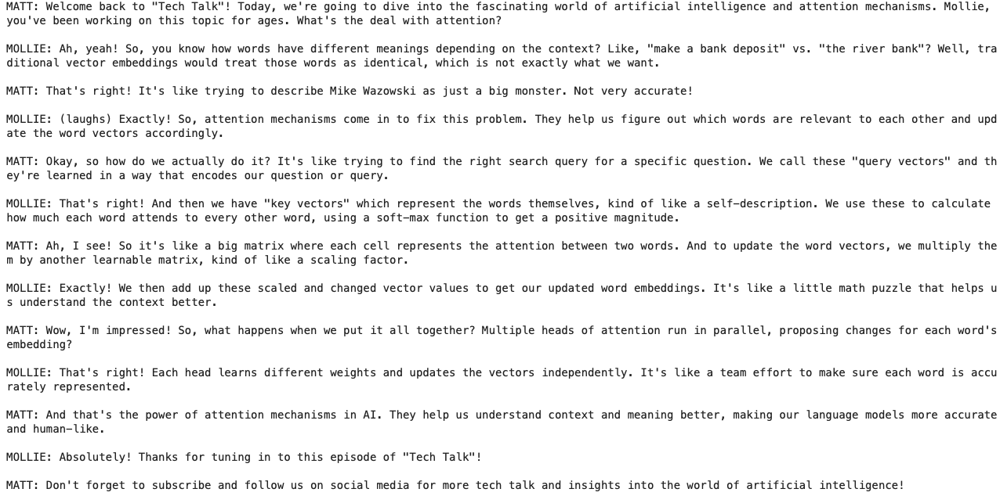




##### Prompt Engineering 📝:
I personally hate this term. But these models are weird forms of _"alien"_ intelligence, and we've got to try and get them to do what we want. But how? By learning how to best ask (prompt 😉) it! 

Below are the most relevant tips for our use case:
- [Be clear and specific](https://docs.anthropic.com/en/docs/build-with-claude/prompt-engineering/be-clear-and-direct)
- [Give examples](https://docs.anthropic.com/en/docs/build-with-claude/prompt-engineering/multishot-prompting)
- [Use XML/HTML tags](https://docs.anthropic.com/en/docs/build-with-claude/prompt-engineering/use-xml-tags)
- [Prefill the model with information](https://docs.anthropic.com/en/docs/build-with-claude/prompt-engineering/prefill-claudes-response)

In [11]:
RADIO_SYSTEM_INSTRUCTIONS = """
<instructions>
- Generate a realistic conversation between two engaging, humourous radio hosts, like on BBC Radio.
- You will be given a student's University notes on a topic to base the conversation on.
- Hosts will explain topic in an engaging way.
- You MUST follow the template and style provided.
</instructions>
"""

RADIO_CONVERSATION_STYLE = """
<conversation_style>
- The hosts will explain the article in a way that is engaging and interesting, for listeners who don't fully understand the topic.
- The conversation should be upbeat and lightly humorous, like on BBC Radio 1.
- DO NOT USE STAGE DIRECTIONS LIKE *LAUGHS* or *GIGGLES*
- It will NOT last longer than 5 conversational turns **IN TOTAL**. 
</conversation_style>
"""
CONVERSATIONAL_OUTPUT_TEMPLATE = """
<output_template>
MATT: ...
MOLLIE: ...
...
</output_template>
"""

RADIO_SYSTEM_PROMPT = f"""
{RADIO_SYSTEM_INSTRUCTIONS}

{RADIO_CONVERSATION_STYLE}

{CONVERSATIONAL_OUTPUT_TEMPLATE}
"""

In [12]:

# TODO: Now, generate text for our radio show conversation!
# Because the prompt is long, and the notes are long, this takes a while on pure CPU.
# Try adding a GPU or making some optimisations!
response = ollama.chat(model='llama3.2:3b', messages=[
  {
    'role': 'system',
    'content': RADIO_SYSTEM_PROMPT
  },
    {
    'role': 'user',
    'content': f'Create a radio dialogue about the following: {relevant_notes}',
    },
])

conversation_transcript = response['message']['content']

print(conversation_transcript)

MATT: Welcome back to "Tech Talk" on BBC Radio! I'm Matt, and joining me as always is Mollie. Today, we're diving into the world of Artificial Intelligence and Attention Mechanisms. You might have heard the term "Attention" before, but what does it really mean?

MOLLIE: Ah, great question, Matt! So, you know how words can have different meanings depending on the context? Like, "make a bank deposit" versus "the river bank"? Well, traditional methods of understanding words, like vector embeddings, would treat these words as identical. But with Attention Mechanisms, we're talking about updating those word vectors to better reflect their actual meaning.

MATT: That's right! Imagine you have a word like "monster", which isn't very descriptive on its own. But when it's part of the sentence "The green, 1-eyed creature is the star of the Disney Pixar movie...", suddenly that vector becomes much closer to the vector for Mike Wazowski! So, how does this magic happen?

MOLLIE: Well, it all comes 

## Generating Audio 🎧

Finally, we'll be generating the audio for our radio show. Text-To-Speech is hard and typically a lot more expensive than text-to-text. The best models are _incredibly_ [expensive](https://elevenlabs.io/pricing). Fortunately, we've got a great open source model called [Kokoro](https://huggingface.co/hexgrad/Kokoro-82M).

_**Think**_ 🤔 _: Why do you think Text-To-Speech is far more expensive than just pure text generation?_

In [19]:
!pip install -q kokoro>=0.3.4 soundfile
# 2️⃣ Install espeak, used for English OOD fallback and some non-English languages
!apt-get -qq -y install espeak-ng > /dev/null 2>&1

from kokoro import KPipeline
from IPython.display import display, Audio
import soundfile as sf
import numpy as np

# 🇺🇸 'a' => American English
# You can change it (and a few other things) to 'b', but it sounds SO much worse. 
# THINK 🤔: Why would that be?

# Initialize two separate pipelines for different voices
pipeline_matt = KPipeline(lang_code='a')    # For Matt's voice
pipeline_mollie = KPipeline(lang_code='a')  # For Mollie's voice

# Split the conversation into individual dialogues
# A lot of this is just python stuff. It's not that bad.
speeches = []
speakers = []

# Split the conversation into the speeches that each radio host gives. 
for line in conversation_transcript.split('\n'):
    # This is why the formatting of the text was really important. 
    if 'matt:' in line.lower():
        speeches.append(line.split(':',1)[1].strip())
        speakers.append('matt')
    elif 'mollie:' in line.lower():
        speeches.append(line.split(':',1)[1].strip())
        speakers.append('mollie')

# Generate audio for the entire conversation
conversation_audio = []

# Process each speech with the appropriate voice
for speech, speaker in zip(speeches, speakers):
    if speaker == 'matt':
        generator = pipeline_matt(speech, voice='am_santa', speed=1) # Hint: Santa sounds hilarious. This sounds hilarious. We're keeping it. 
    else:  # Mollie's speech
        generator = pipeline_mollie(speech, voice='af_heart', speed=1)
    
    for _, _, audio in generator:
        conversation_audio.append(audio)

# Combine and play the final audio
final_audio = np.concatenate(conversation_audio)
display(Audio(data=final_audio, rate=24000, autoplay=True))


am_santa.pt:   0%|          | 0.00/523k [00:00<?, ?B/s]